# Mounting the Google Drive

In [78]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [186]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [187]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
pd.reset_option('display.max_rows')
pd.set_option('display.precision', 2) # display only two decimal digits

# Loading the datasets for this analysis

In [188]:
nasdaq = pd.read_csv("/content/drive/MyDrive/OMIS 114 Project/NASDAQ.csv")
inflation = pd.read_csv("/content/drive/MyDrive/OMIS 114 Project/CPI.csv")
interest_rates = pd.read_csv("/content/drive/MyDrive/OMIS 114 Project/Interest_Rates.csv")
gdp = pd.read_csv("/content/drive/MyDrive/OMIS 114 Project/GDP.csv")
sp500 = pd.read_csv("/content/drive/MyDrive/OMIS 114 Project/^SPX.csv")

In [189]:
nasdaq
inflation
interest_rates
gdp
sp500

,Date,Open,High,Low,Close,Adj Close,Volume
0,1971-02-05,100.000000,100.000000,100.000000,100.000000,100.000000,0
1,1971-02-08,100.839996,100.839996,100.839996,100.839996,100.839996,0
2,1971-02-09,100.760002,100.760002,100.760002,100.760002,100.760002,0
3,1971-02-10,100.690002,100.690002,100.690002,100.690002,100.690002,0
4,1971-02-11,101.449997,101.449997,101.449997,101.449997,101.449997,0
...,...,...,...,...,...,...,...
13373,2024-02-16,15910.429688,15917.410156,15752.019531,15775.650391,15775.650391,5223800000
13374,2024-02-20,15679.839844,15730.469727,15508.500000,15630.780273,15630.780273,5595700000
13375,2024-02-21,15532.120117,15583.679688,15451.650391,15580.870117,15580.870117,4845740000
13376,2024-02-22,15904.480469,16061.820313,15869.240234,16041.620117,16041.620117,5653930000


,DATE,CPIAUCSL
0,1947-01-01,21.480000
1,1947-02-01,21.620000
2,1947-03-01,22.000000
3,1947-04-01,22.000000
4,1947-05-01,21.950000
...,...,...
920,2023-09-01,307.288000
921,2023-10-01,307.531000
922,2023-11-01,308.024000
923,2023-12-01,308.742000


,DATE,FEDFUNDS
0,1954-07-01,1.03000000000000000000
1,1954-10-01,0.98666666666666666667
2,1955-01-01,1.3433333333333333
3,1955-04-01,1.5000000000000000
4,1955-07-01,1.9400000000000000
...,...,...
274,2023-01-01,4.5166666666666667
275,2023-04-01,4.9900000000000000
276,2023-07-01,5.2600000000000000
277,2023-10-01,5.3300000000000000


,DATE,GDP
0,1960-01-01,542.648000
1,1960-04-01,541.080000
2,1960-07-01,545.604000
3,1960-10-01,540.197000
4,1961-01-01,545.018000
...,...,...
251,2022-10-01,26408.405000
252,2023-01-01,26813.601000
253,2023-04-01,27063.012000
254,2023-07-01,27610.128000


,Date,Open,High,Low,Close,Adj Close,Volume
0,1960-01-04,59.910000,59.910000,59.910000,59.910000,59.910000,3990000
1,1960-01-05,60.389999,60.389999,60.389999,60.389999,60.389999,3710000
2,1960-01-06,60.130001,60.130001,60.130001,60.130001,60.130001,3730000
3,1960-01-07,59.689999,59.689999,59.689999,59.689999,59.689999,3310000
4,1960-01-08,59.500000,59.500000,59.500000,59.500000,59.500000,3290000
...,...,...,...,...,...,...,...
16142,2024-02-21,4963.029785,4983.209961,4946.000000,4981.799805,4981.799805,3788390000
16143,2024-02-22,5038.830078,5094.390137,5038.830078,5087.029785,5087.029785,4051710000
16144,2024-02-23,5100.919922,5111.060059,5081.459961,5088.799805,5088.799805,3672790000
16145,2024-02-26,5093.000000,5097.660156,5068.910156,5069.529785,5069.529785,3683930000


# Preprocessing the Datasets

Checking to see if there are any null rows in the datasets

In [190]:

nasdaq.info()
nasdaq.isnull().sum()
print()
print()
sp500.info()
sp500.isnull().sum()
print()
print()
inflation.info()
inflation.isnull().sum()
print()
print()
interest_rates.info()
interest_rates.isnull().sum()
print()
print()
gdp.info()
gdp.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13378 entries, 0 to 13377
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       13378 non-null  object 
 1   Open       13378 non-null  float64
 2   High       13378 non-null  float64
 3   Low        13378 non-null  float64
 4   Close      13378 non-null  float64
 5   Adj Close  13378 non-null  float64
 6   Volume     13378 non-null  int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 731.7+ KB


Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16147 entries, 0 to 16146
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       16147 non-null  object 
 1   Open       16147 non-null  float64
 2   High       16147 non-null  float64
 3   Low        16147 non-null  float64
 4   Close      16147 non-null  float64
 5   Adj Close  16147 non-null  float64
 6   Volume     16147 non-null  int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 883.2+ KB


Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 925 entries, 0 to 924
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   DATE      925 non-null    object 
 1   CPIAUCSL  925 non-null    float64
dtypes: float64(1), object(1)
memory usage: 14.6+ KB


DATE        0
CPIAUCSL    0
dtype: int64



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 279 entries, 0 to 278
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   DATE      279 non-null    object
 1   FEDFUNDS  279 non-null    object
dtypes: object(2)
memory usage: 4.5+ KB


DATE        0
FEDFUNDS    0
dtype: int64



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 256 entries, 0 to 255
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   DATE    256 non-null    object 
 1   GDP     256 non-null    float64
dtypes: float64(1), object(1)
memory usage: 4.1+ KB


DATE    0
GDP     0
dtype: int64

Now that we know there aren't any null rows, we can get started with pre-processing. First, we should ensure that the values under all the Date columns are the same, so that they can be effectively merged

In [191]:
#Rename the columns names so they are consistent
inflation = inflation.rename(columns={'DATE': 'Date'})
interest_rates = interest_rates.rename(columns={'DATE': 'Date'})
gdp = gdp.rename(columns={'DATE': 'Date'})
interest_rates = interest_rates.rename(columns={'FEDFUNDS': 'Interest_Rate'})
inflation = inflation.rename(columns={'CPIAUCSL': 'CPI'})

In [192]:
#Create datetime objects so we can perform datetime operations
nasdaq['Date'] = pd.to_datetime(nasdaq['Date'])
inflation['Date'] = pd.to_datetime(inflation['Date'])
interest_rates['Date'] = pd.to_datetime(interest_rates['Date'])
gdp['Date'] = pd.to_datetime(gdp['Date'])
sp500['Date'] = pd.to_datetime(sp500['Date'])

In [193]:
#cConvert the data under the relevant columns to numeric
interest_rates['Interest_Rate'] = pd.to_numeric(interest_rates['Interest_Rate'], errors='coerce')
inflation['CPI'] = pd.to_numeric(inflation['CPI'], errors='coerce')


interest_rates['Interest_Rate'] = interest_rates['Interest_Rate'].round(3) #Round the data to 3 decimal places for cleaner presentation
interest_rates

,Date,Interest_Rate
0,1954-07-01,1.030000
1,1954-10-01,0.987000
2,1955-01-01,1.343000
3,1955-04-01,1.500000
4,1955-07-01,1.940000
...,...,...
274,2023-01-01,4.517000
275,2023-04-01,4.990000
276,2023-07-01,5.260000
277,2023-10-01,5.330000


Looking at the inflation dataset, we see that the current indicator for inflation is the collection of CPI values. We want to change them to inflation rates, as they are easier to comprehend. The relation between CPI and Inflation Rate is:

>  $
\text{Inflation Rate} = \left( \frac{\text{Current CPI} - \text{Previous CPI}}{\text{Previous CPI}} \right) \times 100
$










In [194]:
inflation['Inflation_Rate'] = ((inflation['CPI'] - inflation['CPI'].shift(12)) / inflation['CPI'].shift(12)) * 100 # We use shift(12) to calculate yearly inflation rates
pd.set_option('display.max_rows', None)
inflation.head(100)

,Date,CPI,Inflation_Rate
0,1947-01-01,21.480000,NaN
1,1947-02-01,21.620000,NaN
2,1947-03-01,22.000000,NaN
3,1947-04-01,22.000000,NaN
4,1947-05-01,21.950000,NaN
5,1947-06-01,22.080000,NaN
6,1947-07-01,22.230000,NaN
7,1947-08-01,22.400000,NaN
8,1947-09-01,22.840000,NaN
9,1947-10-01,22.910000,NaN


After looking at the datasets, we see that there are inconsistencies in the time frequencies across the datasets. For example, the S&P 500 and NASDAQ datasets are high-frequency, having a row for almost every day the market is open. On the other hand, the macroeconomic datasets have rows for every month/quarter.

This must be dealt with so that the datasets can be merged effectively. After looking through the data, we have determined that since the GDP and Interest Rate data is reported on a quarterly basis, we can make that the standard. It cannot be monthly or daily, as there will be far too much missing data.

Let's start by trimming the data, to have a consistent start and end date. After reviewing the data, it seems like we will have to start from the year 1971, as all our datasets contain this year, but do not contain earlier years like 1960. Similarly, all the datasets contain the date 2023-10-01, but only some go beyond.

In [195]:
nasdaq = nasdaq[(nasdaq['Date'] >= "1971-04-01") & (nasdaq['Date'] <= "2023-10-01")]
inflation = inflation[(inflation['Date'] >= "1971-04-01") & (inflation['Date'] <= "2023-10-01")]
interest_rates = interest_rates[(interest_rates['Date'] >= "1971-04-01") & (interest_rates['Date'] <= "2023-10-01")]
sp500 = sp500[(sp500['Date'] >= "1971-04-01") & (sp500['Date'] <= "2023-10-01")]
gdp = gdp[(gdp['Date'] >= "1971-04-01") & (gdp['Date'] <= "2023-10-01")]
nasdaq
inflation[10:]
interest_rates
gdp
sp500

,Date,Open,High,Low,Close,Adj Close,Volume
38,1971-04-01,106.339996,106.339996,106.339996,106.339996,106.339996,0
39,1971-04-02,106.860001,106.860001,106.860001,106.860001,106.860001,0
40,1971-04-05,107.169998,107.169998,107.169998,107.169998,107.169998,0
41,1971-04-06,107.559998,107.559998,107.559998,107.559998,107.559998,0
42,1971-04-07,108.059998,108.059998,108.059998,108.059998,108.059998,0
43,1971-04-08,108.379997,108.379997,108.379997,108.379997,108.379997,0
44,1971-04-12,108.870003,108.870003,108.870003,108.870003,108.870003,0
45,1971-04-13,108.849998,108.849998,108.849998,108.849998,108.849998,0
46,1971-04-14,109.080002,109.080002,109.080002,109.080002,109.080002,0
47,1971-04-15,109.690002,109.690002,109.690002,109.690002,109.690002,0


,Date,CPI,Inflation_Rate
301,1972-02-01,41.400000,3.759398
302,1972-03-01,41.400000,3.500000
303,1972-04-01,41.500000,3.491272
304,1972-05-01,41.600000,3.225806
305,1972-06-01,41.700000,2.962963
306,1972-07-01,41.800000,2.955665
307,1972-08-01,41.900000,2.948403
308,1972-09-01,42.100000,3.186275
309,1972-10-01,42.200000,3.178484
310,1972-11-01,42.400000,3.414634


,Date,Interest_Rate
67,1971-04-01,4.567000
68,1971-07-01,5.477000
69,1971-10-01,4.750000
70,1972-01-01,3.547000
71,1972-04-01,4.300000
72,1972-07-01,4.743000
73,1972-10-01,5.147000
74,1973-01-01,6.537000
75,1973-04-01,7.817000
76,1973-07-01,10.560000


,Date,GDP
45,1971-04-01,1156.271000
46,1971-07-01,1177.675000
47,1971-10-01,1190.297000
48,1972-01-01,1230.609000
49,1972-04-01,1266.369000
50,1972-07-01,1290.566000
51,1972-10-01,1328.904000
52,1973-01-01,1377.490000
53,1973-04-01,1413.887000
54,1973-07-01,1433.838000


,Date,Open,High,Low,Close,Adj Close,Volume
2805,1971-04-01,0.000000,100.989998,99.629997,100.389999,100.389999,13470000
2806,1971-04-02,0.000000,101.230003,99.860001,100.559998,100.559998,14520000
2807,1971-04-05,0.000000,101.410004,99.879997,100.790001,100.790001,16040000
2808,1971-04-06,0.000000,102.110001,100.300003,101.510002,101.510002,19990000
2809,1971-04-07,0.000000,102.870003,101.129997,101.980003,101.980003,22270000
2810,1971-04-08,0.000000,102.860001,101.300003,102.099998,102.099998,17590000
2811,1971-04-12,0.000000,103.540001,101.750000,102.879997,102.879997,19410000
2812,1971-04-13,0.000000,103.959999,102.250000,102.980003,102.980003,23200000
2813,1971-04-14,0.000000,104.010002,102.279999,103.370003,103.370003,19440000
2814,1971-04-15,0.000000,104.400002,102.760002,103.519997,103.519997,22540000


Instead of filtering the dataframes to only show quarterly time frequencies, we used the merge_asof() function, which in this case approximates the stock price using the row in the sp500 dataframe whose date closest aligns with the date in the gdp dataframe. The reason for this choice is because the sp500 and nasdaq dataframes do have gaps on days when the stock market is closed, so there is a date mismatch between the stock price and macroeconomic datasets.

In [196]:
# Perform as-of merge based on the 'Date' column
merged_sp500 = pd.merge_asof(gdp, sp500, on='Date')
merged_sp500 = merged_sp500.merge(interest_rates,on='Date')
merged_sp500 = merged_sp500.merge(inflation,on='Date')

merged_nasdaq = pd.merge_asof(gdp, nasdaq, on='Date')
merged_nasdaq = merged_nasdaq.merge(interest_rates, on='Date')
merged_nasdaq = merged_nasdaq.merge(inflation, on='Date')
merged_nasdaq
merged_sp500

,Date,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
0,1971-04-01,1156.271000,106.339996,106.339996,106.339996,106.339996,106.339996,0,4.567000,40.100000,4.155844
1,1971-07-01,1177.675000,108.470001,108.470001,108.470001,108.470001,108.470001,0,5.477000,40.600000,4.370180
2,1971-10-01,1190.297000,109.580002,109.580002,109.580002,109.580002,109.580002,0,4.750000,40.900000,3.807107
3,1972-01-01,1230.609000,114.120003,114.120003,114.120003,114.120003,114.120003,0,3.547000,41.200000,3.258145
4,1972-04-01,1266.369000,128.139999,128.139999,128.139999,128.139999,128.139999,0,4.300000,41.500000,3.491272
5,1972-07-01,1290.566000,130.080002,130.080002,130.080002,130.080002,130.080002,0,4.743000,41.800000,2.955665
6,1972-10-01,1328.904000,129.610001,129.610001,129.610001,129.610001,129.610001,0,5.147000,42.200000,3.178484
7,1973-01-01,1377.490000,133.729996,133.729996,133.729996,133.729996,133.729996,0,6.537000,42.700000,3.640777
8,1973-04-01,1413.887000,117.459999,117.459999,117.459999,117.459999,117.459999,0,7.817000,43.700000,5.301205
9,1973-07-01,1433.838000,100.980003,100.980003,100.980003,100.980003,100.980003,0,10.560000,44.200000,5.741627


,Date,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
0,1971-04-01,1156.271000,0.000000,100.989998,99.629997,100.389999,100.389999,13470000,4.567000,40.100000,4.155844
1,1971-07-01,1177.675000,0.000000,100.650002,99.160004,99.779999,99.779999,13090000,5.477000,40.600000,4.370180
2,1971-10-01,1190.297000,0.000000,99.489998,97.959999,98.930000,98.930000,13400000,4.750000,40.900000,3.807107
3,1972-01-01,1230.609000,0.000000,102.089996,102.089996,102.089996,102.089996,14040000,3.547000,41.200000,3.258145
4,1972-04-01,1266.369000,0.000000,107.669998,106.070000,107.199997,107.199997,14360000,4.300000,41.500000,3.491272
5,1972-07-01,1290.566000,0.000000,107.910004,106.400002,107.139999,107.139999,12860000,4.743000,41.800000,2.955665
6,1972-10-01,1328.904000,0.000000,110.550003,108.050003,110.550003,110.550003,16250000,5.147000,42.200000,3.178484
7,1973-01-01,1377.490000,0.000000,118.769997,116.699997,118.050003,118.050003,27550000,6.537000,42.700000,3.640777
8,1973-04-01,1413.887000,0.000000,112.870003,110.889999,111.519997,111.519997,13740000,7.817000,43.700000,5.301205
9,1973-07-01,1433.838000,0.000000,105.300003,103.680000,104.260002,104.260002,10770000,10.560000,44.200000,5.741627


# Exploratory Data Analysis

Now that the data has been preprocessed, it is time to uncover some trends in the data.


In [197]:
merged_nasdaq.reset_index(inplace=True) #Resets the index
merged_nasdaq = merged_nasdaq.drop('index', axis=1) #Drops the index column that is created as a result
merged_nasdaq['Date'] = pd.to_datetime(merged_nasdaq['Date']) #Converts the Date column to a datetime object
merged_nasdaq.set_index('Date', inplace=True) #Sets index again
merged_nasdaq.describe()

,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
count,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000
mean,10190.801787,2495.367774,2511.656395,2477.822375,2497.159863,2497.159863,1131286066.350711,4.869090,159.867455,4.001222
std,7110.219077,3382.123286,3403.623465,3360.893434,3385.808333,3385.808333,1285338466.848018,3.924867,71.356022,2.967366
min,1156.271000,55.480000,55.480000,55.480000,55.480000,55.480000,0.000000,0.060000,40.100000,-1.958761
25%,4046.925500,274.699997,274.699997,274.699997,274.699997,274.699997,0.000000,1.346500,103.700000,2.106813
50%,8662.823000,1289.239990,1291.880005,1285.449951,1291.030029,1291.030029,666010000.000000,4.907000,160.400000,3.178484
75%,15225.540500,2752.060059,2773.079956,2736.655029,2765.295044,2765.295044,1902240000.000000,6.800000,219.025500,4.880168
max,27938.831000,15722.910156,15777.429688,15643.940430,15644.969727,15644.969727,5521150000.000000,17.780000,307.531000,14.589235


In [198]:
len(merged_nasdaq)
len(merged_sp500)

211

211

In [199]:
print('Max CPI instance:')
merged_nasdaq[merged_nasdaq.CPI == merged_nasdaq.CPI.max()]
print()
print('Max Inflation Rate instance:')
merged_nasdaq[merged_nasdaq.Inflation_Rate == merged_nasdaq.Inflation_Rate.max()]
print()
print('Max Interest Rate instance:')
merged_nasdaq[merged_nasdaq.Interest_Rate == merged_nasdaq.Interest_Rate.max()]
print()
print('Max GDP instance:')
merged_nasdaq[merged_nasdaq.GDP == merged_nasdaq.GDP.max()]
print('Max Stock Price instance:')
merged_nasdaq[merged_nasdaq.Close == merged_nasdaq.Close.max()]
print()
print('Min CPI instance:')
merged_nasdaq[merged_nasdaq.CPI == merged_nasdaq.CPI.min()]
print()
print('Min Inflation Rate instance:')
merged_nasdaq[merged_nasdaq.Inflation_Rate == merged_nasdaq.Inflation_Rate.min()]
print()
print('Min Interest Rate instance:')
merged_nasdaq[merged_nasdaq.Interest_Rate == merged_nasdaq.Interest_Rate.min()]
print()
print('Min GDP instance:')
merged_nasdaq[merged_nasdaq.GDP == merged_nasdaq.GDP.min()]
print()
print('Min Stock Price instance:')
merged_nasdaq[merged_nasdaq.Close == merged_nasdaq.Close.min()]
print()

#Output the bottom 15 inflation and interest rates, to further investigate their relationship, as the housing crisis and COVID-19 must be accounted for.
merged_nasdaq.sort_values(by='Inflation_Rate').Inflation_Rate.head(15)
merged_nasdaq.sort_values(by='Interest_Rate').Interest_Rate.head(15)


Max CPI instance:


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
Date,,,,,,,,,,
2023-10-01,27938.831000,13337.709961,13382.980469,13177.089844,13219.320313,13219.320313,5138500000,5.330000,307.531000,3.245787



Max Inflation Rate instance:


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
Date,,,,,,,,,,
1980-04-01,2797.352000,133.139999,133.139999,133.139999,133.139999,133.139999,0,12.687000,80.900000,14.589235



Max Interest Rate instance:


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
Date,,,,,,,,,,
1981-04-01,3162.532000,211.339996,211.339996,211.339996,211.339996,211.339996,0,17.780000,89.100000,10.135970



Max GDP instance:


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
Date,,,,,,,,,,
2023-10-01,27938.831000,13337.709961,13382.980469,13177.089844,13219.320313,13219.320313,5138500000,5.330000,307.531000,3.245787


Max Stock Price instance:


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
Date,,,,,,,,,,
2022-01-01,25029.116000,15722.910156,15777.429688,15643.940430,15644.969727,15644.969727,3392580000,0.120000,282.390000,7.569767



Min CPI instance:


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
Date,,,,,,,,,,
1971-04-01,1156.271000,106.339996,106.339996,106.339996,106.339996,106.339996,0,4.567000,40.100000,4.155844



Min Inflation Rate instance:


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
Date,,,,,,,,,,
2009-07-01,14448.882000,1846.119995,1861.619995,1843.790039,1845.719971,1845.719971,1971050000,0.157000,214.726000,-1.958761



Min Interest Rate instance:


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
Date,,,,,,,,,,
2020-04-01,19913.143000,7459.500000,7566.370117,7301.979980,7360.580078,7360.580078,3700040000,0.060000,256.126000,0.349876



Min GDP instance:


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
Date,,,,,,,,,,
1971-04-01,1156.271000,106.339996,106.339996,106.339996,106.339996,106.339996,0,4.567000,40.100000,4.155844



Min Stock Price instance:


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
Date,,,,,,,,,,
1974-10-01,1599.679000,55.480000,55.480000,55.480000,55.480000,55.480000,0,9.347000,51.000000,11.842105


Date
2009-07-01   -1.958761
2009-04-01   -0.576324
2015-01-01   -0.229931
2009-10-01   -0.223968
2009-01-01   -0.113586
2015-04-01   -0.104031
2015-10-01    0.127617
2015-07-01    0.225686
2020-04-01    0.349876
2016-07-01    0.868363
2013-10-01    0.876799
2020-07-01    1.018757
2013-04-01    1.138808
2010-10-01    1.166695
2016-04-01    1.172626
Name: Inflation_Rate, dtype: float64

Date
2020-04-01   0.060000
2021-04-01   0.070000
2014-01-01   0.073000
2011-10-01   0.073000
2021-01-01   0.080000
2021-10-01   0.080000
2011-07-01   0.083000
2013-07-01   0.083000
2013-10-01   0.087000
2020-10-01   0.090000
2021-07-01   0.090000
2014-07-01   0.090000
2011-04-01   0.093000
2014-04-01   0.093000
2020-07-01   0.093000
Name: Interest_Rate, dtype: float64

Some initial observations after looking at the various instances for the minimum and maximum values of different variables are:
1. GDP and CPI seem to be heavily correlated, with their minimum and maximum values being observed on the same day.
2. The GDP/CPI values seem to have some correlation to the stock price values. Their maximum values are observed only one quarter of each other and their minimum values are within 3 years of each other.
3. Max inflation and interest rates occured around the same time period, whereas the minumum rates occured at drastically different time periods, in the years 2009 and 2020 respectively. These also happen to be the years the housing crisis and COVID-19 occured, respectively. We tried to output the 15 lowest rates to see if there are any overlaps, but a more sophisticated analysis will be done soon.

In [200]:
#Repeating the process for the S&P 500 data
merged_sp500.reset_index(inplace=True)
merged_sp500 = merged_sp500.drop('index', axis=1)
merged_sp500['Date'] = pd.to_datetime(merged_sp500['Date'])
merged_sp500.set_index('Date', inplace=True)
merged_sp500.describe()

,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
count,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000
mean,10190.801787,1037.630237,1066.378678,1053.713549,1061.063558,1061.063558,1487053554.502370,4.869090,159.867455,4.001222
std,7110.219077,1113.770105,1100.469743,1088.674987,1095.674402,1095.674402,1715614508.702257,3.924867,71.356022,2.967366
min,1156.271000,0.000000,64.370003,61.750000,63.389999,63.389999,10270000.000000,0.060000,40.100000,-1.958761
25%,4046.925500,166.180001,166.665001,165.105004,165.500000,165.500000,76945000.000000,1.346500,103.700000,2.106813
50%,8662.823000,793.590027,813.619995,783.320007,811.080017,811.080017,467280000.000000,4.907000,160.400000,3.178484
75%,15225.540500,1412.915039,1426.869995,1405.160034,1419.580017,1419.580017,3077125000.000000,6.800000,219.025500,4.880168
max,27938.831000,4775.209961,4786.830078,4765.750000,4766.180176,4766.180176,6435770000.000000,17.780000,307.531000,14.589235


In [201]:
#Output the max and min stock prices in the merged_sp500 dataset.
print('Max Stock Price instance:')
merged_sp500[merged_sp500.Close == merged_sp500.Close.max()]
print()
print('Min Stock Price instance:')
merged_sp500[merged_sp500.Close == merged_sp500.Close.min()]
print()


Max Stock Price instance:


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
Date,,,,,,,,,,
2022-01-01,25029.116000,4775.209961,4786.830078,4765.750000,4766.180176,4766.180176,2677820000,0.120000,282.390000,7.569767



Min Stock Price instance:


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
Date,,,,,,,,,,
1974-10-01,1599.679000,0.000000,64.370003,61.750000,63.389999,63.389999,16890000,9.347000,51.000000,11.842105


An interesting but perhaps obvious result we see here is that the min and max stock close values of both the S&P 500 and NASDAQ occur on the same days. Let's do a correlation analysis to see if some of our observations are true.



merged_nasdaq correlation matrix:


<Figure size 1000x800 with 0 Axes>

<Axes: >

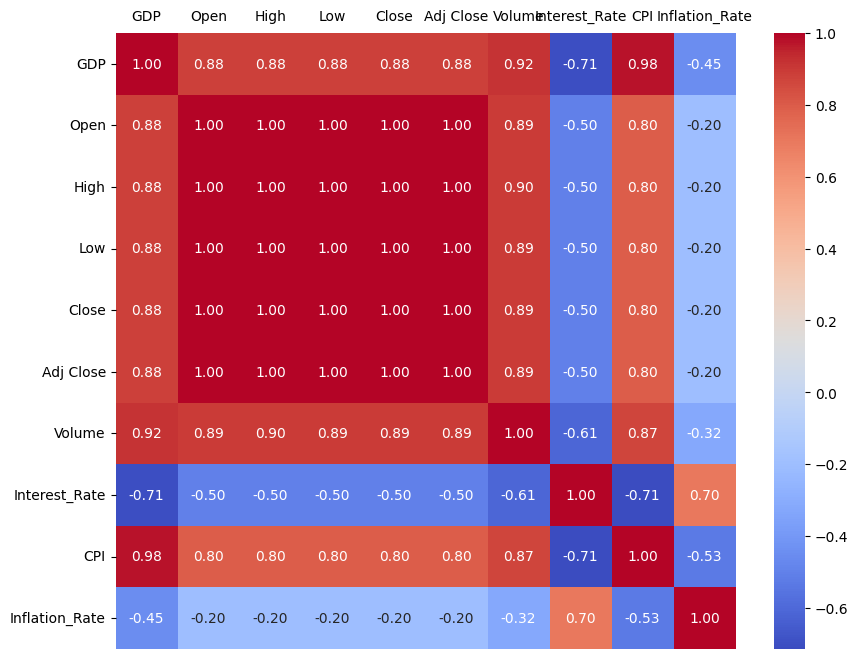

In [202]:

print('merged_nasdaq correlation matrix:')
correlation_matrix_nasdaq = merged_nasdaq.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_nasdaq, annot=True, cmap='coolwarm', fmt=".2f")
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)

merged_sp500 correlation matrix:


<Figure size 1000x800 with 0 Axes>

<Axes: >

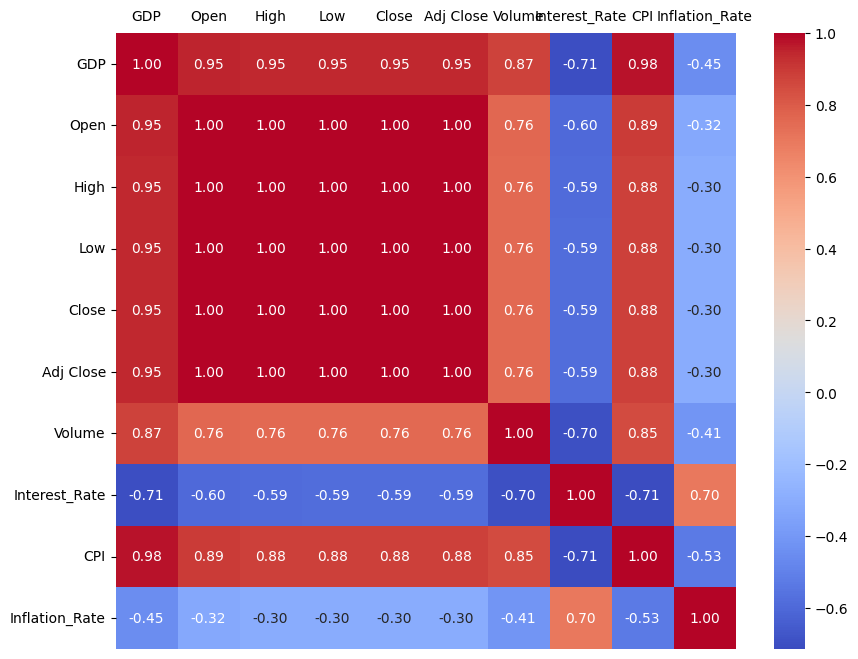

In [203]:
print('merged_sp500 correlation matrix:')
correlation_matrix_sp500 = merged_sp500.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_sp500, annot=True, cmap='coolwarm', fmt=".2f")
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)

From the correlation analyses, it seems like there are fairly strong correlations between all of the variables.

**GDP** seems to have strong correlations with the marcoeconomic data, and even stronger correlations with the stock price data, which is a good sign. It also appears to be more strongly correlated with the **S&P 500** data, over the **NASDAQ** data.

As observed, it seems like there is a decently strong connection between **Inflation** Rate and **Interest** Rates. Unfortunately, **inflation** rate does not seem to be strongly correlated to **stock price**, although **CPI** is strongly correlated to it.

In [204]:
correlation_matrix_sp500.describe()
correlation_matrix_nasdaq.describe()

,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.642639,0.667967,0.669606,0.669335,0.669489,0.669489,0.540448,-0.336167,0.600092,-0.122817
std,0.647221,0.603454,0.596186,0.596003,0.596020,0.596020,0.586170,0.631812,0.648286,0.523968
min,-0.705125,-0.598664,-0.587580,-0.587163,-0.587414,-0.587414,-0.695416,-0.714740,-0.714740,-0.533375
25%,0.891016,0.793851,0.789368,0.787676,0.788519,0.788519,0.756638,-0.671228,0.858076,-0.391302
50%,0.945289,0.975175,0.972517,0.972270,0.972316,0.972316,0.757931,-0.587497,0.881783,-0.301890
75%,0.949666,0.999366,0.999966,0.999966,0.999968,0.999968,0.827865,-0.587226,0.890426,-0.301475
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.614122,0.686591,0.686790,0.686542,0.686683,0.686683,0.632354,-0.284356,0.558946,-0.062384
std,0.632953,0.556948,0.556967,0.556760,0.556782,0.556782,0.584746,0.608330,0.629646,0.500371
min,-0.705125,-0.502515,-0.502476,-0.502202,-0.502216,-0.502216,-0.613911,-0.714740,-0.714740,-0.533375
25%,0.880726,0.818557,0.818914,0.818251,0.818345,0.818345,0.876497,-0.586062,0.797457,-0.291701
50%,0.880837,0.947014,0.947542,0.946683,0.947235,0.947235,0.894299,-0.502346,0.797656,-0.203909
75%,0.907167,0.999968,0.999962,0.999968,0.999967,0.999967,0.894974,-0.502205,0.852677,-0.203636
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


It seems like the S&P 500 values are more favorable, given the higher mean values overall in the S&P 500 correlation matrix columns, indicating higher correlations among variables. Let's use this dataframe for our analysis for stronger prediction models.

Now that we've identified some initial trends, let's try to visualize them to obtain a clearer picture.

In [205]:
merged_sp500.reset_index(inplace=True)

<Figure size 1200x600 with 0 Axes>

Text(0.5, 1.0, 'Close Price of S&P 500 over Time')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Close Price')

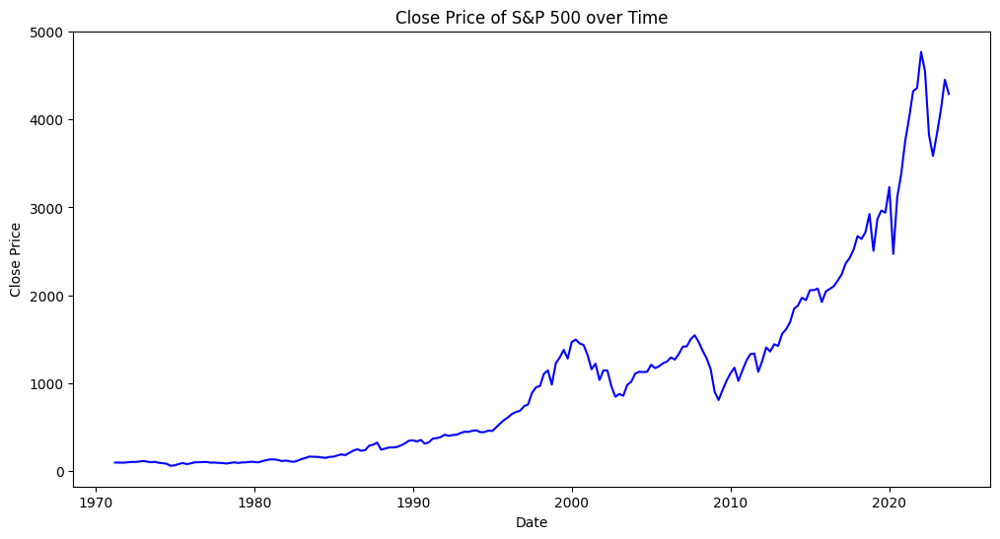

In [206]:
#Plot Close Price to visualize the curve

merged_sp500.index = pd.to_datetime(merged_sp500['Date'])
merged_sp500.set_index('Date', inplace=True)
plt.figure(figsize=(12, 6))
plt.plot(merged_sp500['Close'], color='blue')
plt.title('Close Price of S&P 500 over Time')
plt.xlabel('Date')
plt.ylabel('Close Price')

In [207]:
merged_sp500.Close.describe()

count    211.000000
mean    1061.063558
std     1095.674402
min       63.389999
25%      165.500000
50%      811.080017
75%     1419.580017
max     4766.180176
Name: Close, dtype: float64

In an effort to create a smoothed curve to remove any inconsistencies and variability, let's using moving averages to forecast Close stock prices

<Figure size 1200x600 with 0 Axes>

Text(0.5, 1.0, 'Close Price of S&P 500 with Forecast (Rolling Window)')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Close Price')

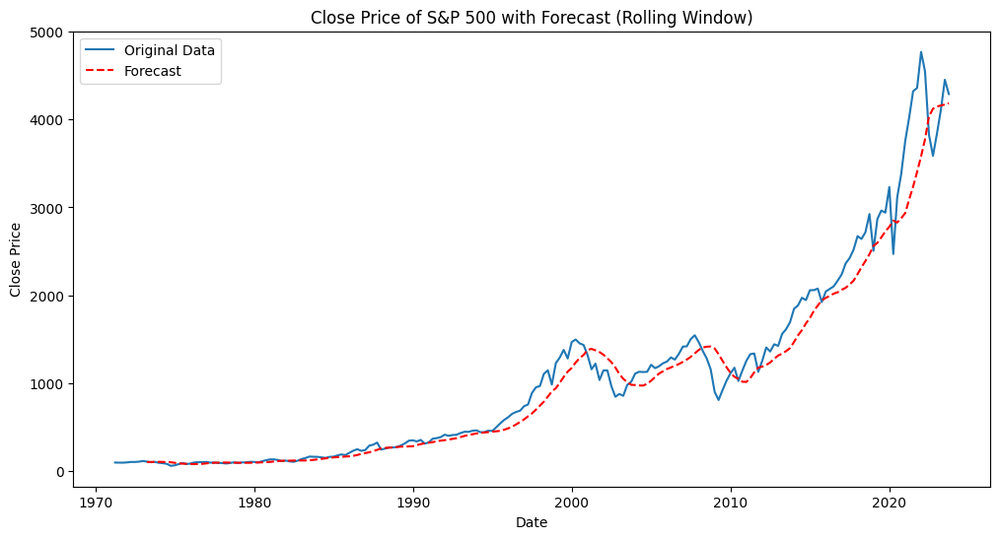

In [208]:
#Time Series Forecasting using a Rolling Window to smooth the data


window_size = 8  #Rolling window (in quarters)

merged_sp500['Forecast'] = np.nan #Create a new column 'Forecast' for the forecasted values

#Iterate over the DataFrame using a rolling window

for i in range(len(merged_sp500) - window_size):
    window = merged_sp500['Close'].iloc[i:i+window_size]
    forecast = window.mean()  # For simplicity, forecast is the mean of the window
    merged_sp500.loc[merged_sp500.index[i+window_size], 'Forecast'] = forecast

# Plot the original Close data along with the new forecasted data
plt.figure(figsize=(12, 6))
plt.plot(merged_sp500['Close'], label='Original Data')
plt.plot(merged_sp500['Forecast'], label='Forecast', linestyle='--', color='red')
plt.title('Close Price of S&P 500 with Forecast (Rolling Window)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()


We have a smoothed Close stock price curve, which may perhaps be useful when using a linear regression model to predict future values. It could be interesting to look at inflation rates and interest rates, in light of the correlation matrix. A scatterplot and line plot should give us more information on their relationship.

<Axes: xlabel='Date'>

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Rate')

Text(0.5, 1.0, 'Interest Rate vs. Inflation Rate over Time')

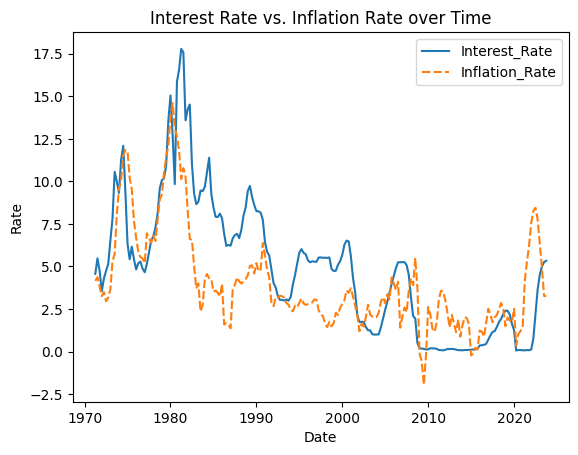

In [209]:
sns.lineplot(data=merged_sp500[['Interest_Rate', 'Inflation_Rate']])

# Add labels and title
plt.xlabel('Date')
plt.ylabel('Rate')
plt.title('Interest Rate vs. Inflation Rate over Time')

It's pretty fascinating to view this time series of Inflation and Interest Rates. From 1970-1980, the two factors seemed to be almost identical, rising and falling at similar rates. In 1980, inflation rates dropped heavily while interest rates continued to rise and then dropped, but not nearly as much as inflation rates. However, they continue to rise and fall together, even there seems to be far less variability in interest rates - the curve seems a lot smoother as compared to the inflation rates curve.

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='Interest_Rate', ylabel='Inflation_Rate'>

Text(0.5, 1.0, 'Interest Rate vs. Inflation Rate')

Text(0.5, 0, 'Interest Rate')

Text(0, 0.5, 'Inflation Rate')

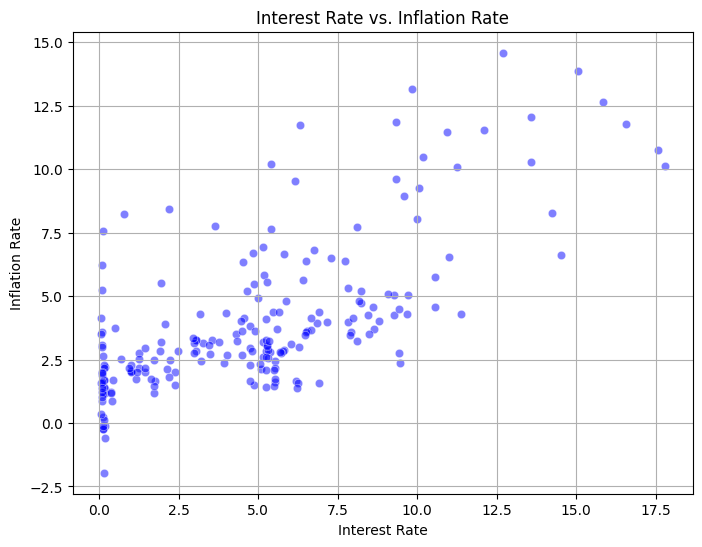

In [210]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=merged_sp500, x='Interest_Rate', y='Inflation_Rate', color='blue', alpha=0.5)
plt.title('Interest Rate vs. Inflation Rate')
plt.xlabel('Interest Rate')
plt.ylabel('Inflation Rate')
plt.grid(True)

This scatterplot signifies a positive relationship between inflation and interest rates. In particular, there seem to be more points concentrated at lower interest rates such as in the interval of 0%-7.5%.

Next, let's look at how GDP, CPI, and Close prices interact. Due to their high correlations seen in the correlation matrix, it will be interesting to see a visual of their relationships.

<Figure size 1000x600 with 0 Axes>

Text(0.5, 0, 'GDP')

Text(0, 0.5, 'Close Price')

Text(0.5, 1.0, 'Close Prices vs GDP')

<Figure size 1000x600 with 0 Axes>

Text(0.5, 0, 'GDP')

Text(0, 0.5, 'Forecasted Close Price')

Text(0.5, 1.0, 'Forecasted Close Prices vs GDP')

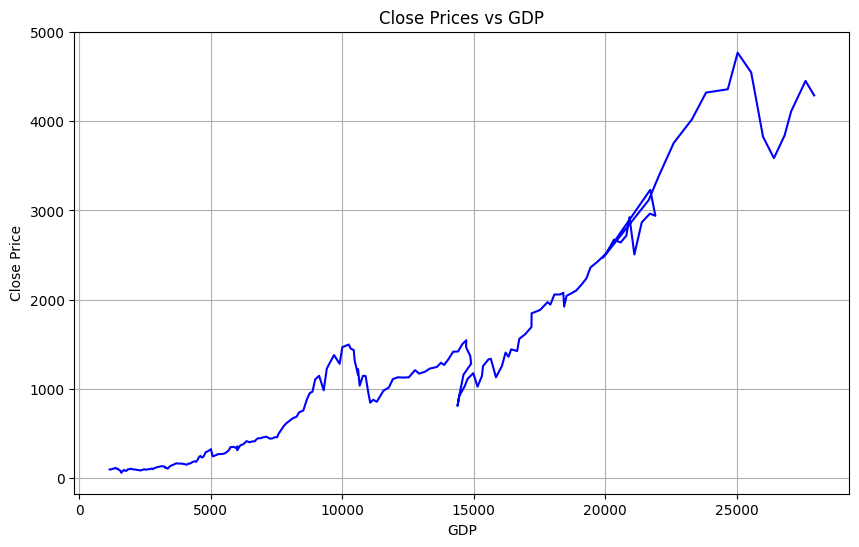

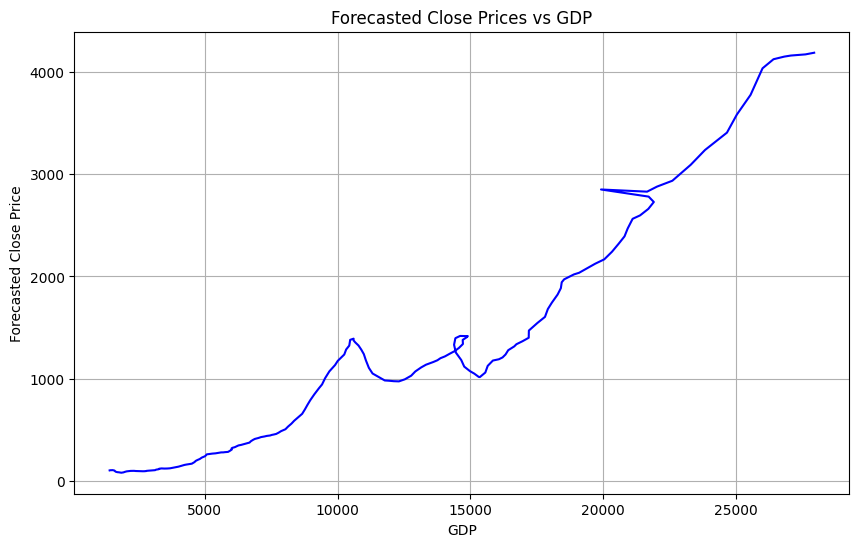

In [211]:
# Plot GDP on x-axis and Close on y-axis
plt.figure(figsize=(10, 6))
plt.plot(merged_sp500['GDP'], merged_sp500['Close'], color='blue', linestyle='-')

# Add labels and title
plt.xlabel('GDP')
plt.ylabel('Close Price')
plt.title('Close Prices vs GDP')

# Show plot
plt.grid(True)

# Plot GDP on x-axis and Close on y-axis
plt.figure(figsize=(10, 6))
plt.plot(merged_sp500['GDP'], merged_sp500['Forecast'], color='blue', linestyle='-')

# Add labels and title
plt.xlabel('GDP')
plt.ylabel('Forecasted Close Price')
plt.title('Forecasted Close Prices vs GDP')

# Show plot
plt.grid(True)


We see that there is an overall positive trend between close price and GDP. It will be exciting to see if there is enough of a trend such that stock prices can be predicted using GDP.

Looking at the relationship between the forecasted Close values and GDP, the line definitely seems more smoothed, but the trendline when GDP is between 10500 and 22000 seems very strange.

In [212]:
merged_nasdaq.head(10)

,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate
Date,,,,,,,,,,
1971-04-01,1156.271000,106.339996,106.339996,106.339996,106.339996,106.339996,0,4.567000,40.100000,4.155844
1971-07-01,1177.675000,108.470001,108.470001,108.470001,108.470001,108.470001,0,5.477000,40.600000,4.370180
1971-10-01,1190.297000,109.580002,109.580002,109.580002,109.580002,109.580002,0,4.750000,40.900000,3.807107
1972-01-01,1230.609000,114.120003,114.120003,114.120003,114.120003,114.120003,0,3.547000,41.200000,3.258145
1972-04-01,1266.369000,128.139999,128.139999,128.139999,128.139999,128.139999,0,4.300000,41.500000,3.491272
1972-07-01,1290.566000,130.080002,130.080002,130.080002,130.080002,130.080002,0,4.743000,41.800000,2.955665
1972-10-01,1328.904000,129.610001,129.610001,129.610001,129.610001,129.610001,0,5.147000,42.200000,3.178484
1973-01-01,1377.490000,133.729996,133.729996,133.729996,133.729996,133.729996,0,6.537000,42.700000,3.640777
1973-04-01,1413.887000,117.459999,117.459999,117.459999,117.459999,117.459999,0,7.817000,43.700000,5.301205


# Predicting Stock Price (ML)

This section is going to look at using regression analysis to predict Close stock prices using macroeconomic factors. We will also look at incorporating lags.

We'll mostly focus on GDP because it was most correlated to the Close prices. Lets start with a regression analysis.

In [213]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import random

X = merged_sp500[['GDP']] #GDP is the independent variable
y = merged_sp500['Close'] #Close is the dependent variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # Split data into training and testing sets
model = LinearRegression() #Initialize linear regression model
model.fit(X_train, y_train) #Train the model

GDP_test = random.choice(merged_sp500['GDP']) #Our test GDP value, generated using the random.choice() function

X_new = np.array([[GDP_test]]) #Create a new dataframe with the GDP value for this instance

y_pred_new = model.predict(X_new) #Predict Close using the trained model
actual = merged_sp500.loc[merged_sp500['GDP'] == GDP_test, 'Close'].values[0]

print("Predicted Close for the new instance using GDP values:", y_pred_new[0].round(3))
print("Actual Close for the new instance using GDP values:", actual)
y_pred_test = model.predict(X_test) #Calculate predictions for the test set

mae = mean_absolute_error(y_test, y_pred_test) #Mean Absolute Error (MAE)
mse = mean_squared_error(y_test, y_pred_test) #Mean Squared Error (MSE)
r2 = r2_score(y_test, y_pred_test) #R-squared (R2)

print("Mean Absolute Error (MAE):", mae.round(3))
print("Mean Squared Error (MSE):", mse.round(3))
print("R-squared (R2):", r2.round(3))



LinearRegression()

Predicted Close for the new instance using GDP values: 90.547
Actual Close for the new instance using GDP values: 121.970001
Mean Absolute Error (MAE): 263.331
Mean Squared Error (MSE): 129483.196
R-squared (R2): 0.903


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


When looking at all the GDP values to predict the Close price, we can see that our model is weak, based off the predicted and actual prices, along with the MAE and MSE values. Let's try to visualize this.

Text(0.5, 0, 'GDP')

Text(0, 0.5, 'Close Price')

Text(0.5, 1.0, 'Linear Regression: Close Price vs. GDP')

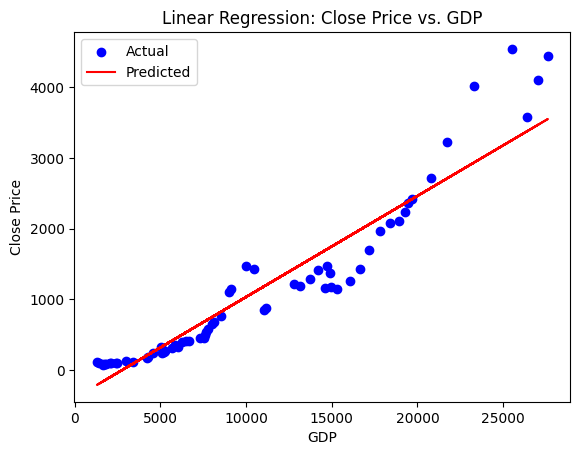

In [214]:
plt.scatter(X_test, y_test, color='blue', label='Actual')
plt.plot(X_test, y_pred_test, color='red', label='Predicted')
plt.xlabel('GDP')
plt.ylabel('Close Price')
plt.title('Linear Regression: Close Price vs. GDP')
plt.legend()

We want to try out a residual analysis too, to get more insights into our model.

Text(0.5, 0, 'Predicted Close')

Text(0, 0.5, 'Residuals')

Text(0.5, 1.0, 'Residual Plot')

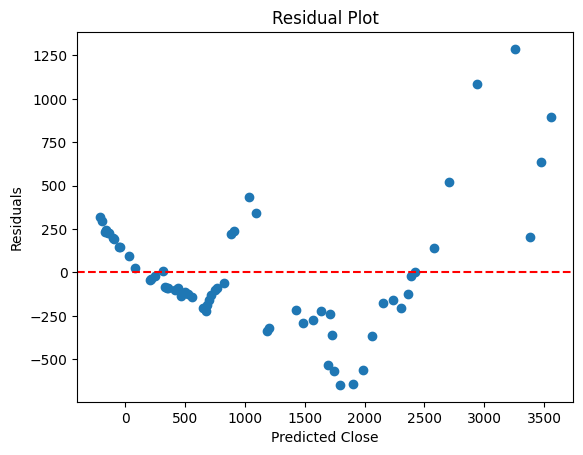

<Axes: xlabel='Close', ylabel='Count'>

Text(0.5, 0, 'Residuals')

Text(0, 0.5, 'Frequency')

Text(0.5, 1.0, 'Distribution of Residuals')

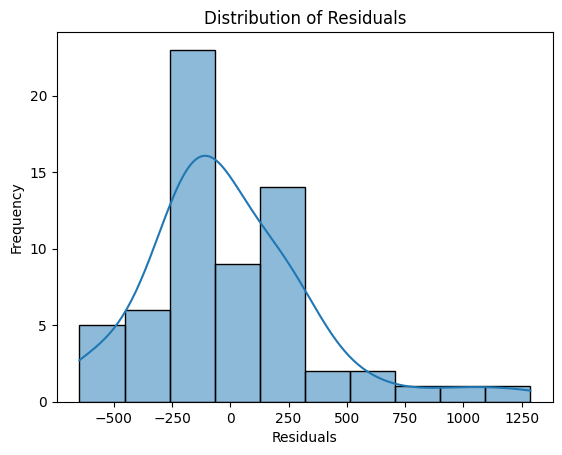

In [215]:
residuals = y_test - y_pred_test
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Close')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()


sns.histplot(residuals, kde=True)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Distribution of Residuals')
plt.show()



Ideally, the first plot should contain a lot of randomness, and should have points evenly distributed above and below the horizontal line. The points should be evenly distributed throughout the plot. This is an indicator of homoscedasticity, which in turn is an indicator of linearity. Unfortunately, there doesn't seem to be a great deal of any of these factors. Also the histogram should be normally distributed around 0, but ours seems skewed.

It could be interesting to look at various time horizons, and how the model will behave when we alter them. Let's start with the first 10 periods. We will also add a lag of one quarter to see how the model runs. Essentially, we will be trying to predict the Close values with the previous quarter's GDP values.

 **10 values**

In [216]:
#Create lagged GDP features

merged_sp500_slice= merged_sp500.head(10) #Taking only the first 10 values
merged_sp500_slice['gdp_lag'] = merged_sp500['GDP'].shift(1) #Add a lag column
merged_sp500_slice.dropna(inplace=True) #Drop rows with NaN values that result from creating lagged features
df = merged_sp500_slice #For simplicity
df


<ipython-input-216-567cb68f4e59>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_sp500_slice['gdp_lag'] = merged_sp500['GDP'].shift(1) #Add a lag column
<ipython-input-216-567cb68f4e59>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_sp500_slice.dropna(inplace=True) #Drop rows with NaN values that result from creating lagged features


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate,Forecast,gdp_lag
Date,,,,,,,,,,,,
1973-04-01,1413.887000,0.000000,112.870003,110.889999,111.519997,111.519997,13740000,7.817000,43.700000,5.301205,105.516250,1377.490000
1973-07-01,1433.838000,0.000000,105.300003,103.680000,104.260002,104.260002,10770000,10.560000,44.200000,5.741627,106.907499,1413.887000


In [217]:
#Linear Regression model using GDP lags
X = df[['gdp_lag']]
y = df['Close']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # Split data into training and testing sets
model = LinearRegression() #Initialize linear regression model
model.fit(X_train, y_train) #Train the model

GDP_test = random.choice(df['gdp_lag']) #Our test GDP value, generated using the random.choice() function

X_new = np.array([[GDP_test]]) #Create a new dataframe with the GDP value for this instance

y_pred_new = model.predict(X_new) #Predict Close using the trained model
actual = df.loc[df['gdp_lag'] == GDP_test, 'Close'].values[0]

print("Predicted Close for the new instance using GDP values:", y_pred_new[0].round(3))
print("Actual Close for the new instance using GDP values:", actual.round(3))
y_pred_test = model.predict(X_test) #Calculate predictions for the test set

mae_lag = mean_absolute_error(y_test, y_pred_test) #Mean Absolute Error (MAE)
mse_lag = mean_squared_error(y_test, y_pred_test) #Mean Squared Error (MSE)
r2_lag = r2_score(y_test, y_pred_test) #R-squared (R2)

print("Mean Absolute Error (MAE):", mae_lag.round(3))
print("Mean Squared Error (MSE):", mse_lag.round(3))
print("R-squared (R2):", r2_lag)


LinearRegression()

Predicted Close for the new instance using GDP values: 111.52
Actual Close for the new instance using GDP values: 104.26
Mean Absolute Error (MAE): 7.26
Mean Squared Error (MSE): 52.708
R-squared (R2): nan


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


In [218]:
#Linear Regression model using normal GDP values
X = df[['GDP']]
y = df['Close']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # Split data into training and testing sets
model = LinearRegression() #Initialize linear regression model
model.fit(X_train, y_train) #Train the model

GDP_test = random.choice(df['GDP']) #Our test GDP value, generated using the random.choice() function

X_new = np.array([[GDP_test]]) #Create a new dataframe with the GDP value for this instance

y_pred_new = model.predict(X_new) #Predict Close using the trained model
actual = df.loc[df['GDP'] == GDP_test, 'Close'].values[0]

print("Predicted Close for the new instance using GDP values:", y_pred_new[0].round(3))
print("Actual Close for the new instance using GDP values:", actual.round(3))
y_pred_test = model.predict(X_test) #Calculate predictions for the test set

mae = mean_absolute_error(y_test, y_pred_test) #Mean Absolute Error (MAE)
mse = mean_squared_error(y_test, y_pred_test) #Mean Squared Error (MSE)
r2 = r2_score(y_test, y_pred_test) #R-squared (R2)

print("Mean Absolute Error (MAE):", mae.round(3))
print("Mean Squared Error (MSE):", mse.round(3))
print("R-squared (R2):", r2)

LinearRegression()

Predicted Close for the new instance using GDP values: 111.52
Actual Close for the new instance using GDP values: 104.26
Mean Absolute Error (MAE): 7.26
Mean Squared Error (MSE): 52.708
R-squared (R2): nan


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


In [219]:
mse_values = [mse, mse_lag]
mae_values = [mae, mae_lag]
model_comparison = pd.DataFrame({
    'Model': ['GDP_10_values', 'GDP_lag_10_values'],
    'Mean Squared Error (MSE)': mse_values,
    'Mean Absolute Error (MAE)': mae_values})
model_comparison


,Model,Mean Squared Error (MSE),Mean Absolute Error (MAE)
0,GDP_10_values,52.707527,7.259995
1,GDP_lag_10_values,52.707527,7.259995


Our results for 10 values are interesting. The MAE and MSE for the lagged model are lower than the normal GDP model. Let's see if this trend continues as we expand out time horizon. Next up is 50 rows.

**50 values:**

In [220]:
#Create lagged GDP features

merged_sp500_slice= merged_sp500.head(50) #Taking only the first 50 values
merged_sp500_slice['gdp_lag'] = merged_sp500['GDP'].shift(1) #Add a lag column
merged_sp500_slice.dropna(inplace=True) #Drop rows with NaN values that result from creating lagged features
df = merged_sp500_slice #For simplicity
df.head()


<ipython-input-220-4680a8375399>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_sp500_slice['gdp_lag'] = merged_sp500['GDP'].shift(1) #Add a lag column
<ipython-input-220-4680a8375399>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_sp500_slice.dropna(inplace=True) #Drop rows with NaN values that result from creating lagged features


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate,Forecast,gdp_lag
Date,,,,,,,,,,,,
1973-04-01,1413.887000,0.000000,112.870003,110.889999,111.519997,111.519997,13740000,7.817000,43.700000,5.301205,105.516250,1377.490000
1973-07-01,1433.838000,0.000000,105.300003,103.680000,104.260002,104.260002,10770000,10.560000,44.200000,5.741627,106.907499,1413.887000
1973-10-01,1476.289000,0.000000,108.980003,107.080002,108.209999,108.209999,15830000,9.997000,45.600000,8.056872,107.467500,1433.838000
1974-01-01,1491.209000,0.000000,98.300003,95.949997,97.550003,97.550003,23470000,9.323000,46.800000,9.601874,108.627499,1476.289000
1974-04-01,1530.056000,0.000000,94.680000,92.820000,93.250000,93.250000,11470000,11.250000,48.100000,10.068650,108.060000,1491.209000


In [221]:
#Linear Regression model using GDP lags
X = df[['gdp_lag']]
y = df['Close']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # Split data into training and testing sets
model = LinearRegression() #Initialize linear regression model
model.fit(X_train, y_train) #Train the model

GDP_test = random.choice(df['gdp_lag']) #Our test GDP value, generated using the random.choice() function

X_new = np.array([[GDP_test]]) #Create a new dataframe with the GDP value for this instance

y_pred_new = model.predict(X_new) #Predict Close using the trained model
actual = df.loc[df['gdp_lag'] == GDP_test, 'Close'].values[0]

print("Predicted Close for the new instance using GDP values:", y_pred_new[0].round(3))
print("Actual Close for the new instance using GDP values:", actual.round(3))
y_pred_test = model.predict(X_test) #Calculate predictions for the test set

mae_lag = mean_absolute_error(y_test, y_pred_test) #Mean Absolute Error (MAE)
mse_lag = mean_squared_error(y_test, y_pred_test) #Mean Squared Error (MSE)
r2_lag = r2_score(y_test, y_pred_test) #R-squared (R2)

print("Mean Absolute Error (MAE):", mae_lag.round(3))
print("Mean Squared Error (MSE):", mse_lag.round(3))
print("R-squared (R2):", r2_lag)


LinearRegression()

Predicted Close for the new instance using GDP values: 132.81
Actual Close for the new instance using GDP values: 168.64
Mean Absolute Error (MAE): 8.302
Mean Squared Error (MSE): 110.19
R-squared (R2): 0.6703982623570366


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [222]:
#Linear Regression model using normal GDP values
X = df[['GDP']]
y = df['Close']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # Split data into training and testing sets
model = LinearRegression() #Initialize linear regression model
model.fit(X_train, y_train) #Train the model

GDP_test = random.choice(df['GDP']) #Our test GDP value, generated using the random.choice() function

X_new = np.array([[GDP_test]]) #Create a new dataframe with the GDP value for this instance

y_pred_new = model.predict(X_new) #Predict Close using the trained model
actual = df.loc[df['GDP'] == GDP_test, 'Close'].values[0]

print("Predicted Close for the new instance using GDP values:", y_pred_new[0].round(3))
print("Actual Close for the new instance using GDP values:", actual.round(3))
y_pred_test = model.predict(X_test) #Calculate predictions for the test set

mae = mean_absolute_error(y_test, y_pred_test) #Mean Absolute Error (MAE)
mse = mean_squared_error(y_test, y_pred_test) #Mean Squared Error (MSE)
r2 = r2_score(y_test, y_pred_test) #R-squared (R2)

print("Mean Absolute Error (MAE):", mae.round(3))
print("Mean Squared Error (MSE):", mse.round(3))
print("R-squared (R2):", r2)

LinearRegression()

Predicted Close for the new instance using GDP values: 102.662
Actual Close for the new instance using GDP values: 96.53
Mean Absolute Error (MAE): 8.251
Mean Squared Error (MSE): 107.529
R-squared (R2): 0.6783573389036037


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [223]:
mse_values = [mse, mse_lag]
mae_values = [mae, mae_lag]
model_comparison = pd.DataFrame({
    'Model': ['GDP_50_values', 'GDP_lag_50_values'],
    'Mean Squared Error (MSE)': mse_values,
    'Mean Absolute Error (MAE)': mae_values})
model_comparison


,Model,Mean Squared Error (MSE),Mean Absolute Error (MAE)
0,GDP_50_values,107.529269,8.250725
1,GDP_lag_50_values,110.190090,8.302443


For 50 values, the numbers have not changed much, although the normal GDP model seems to be performing much better. Its MSE value is lower than the lagged model's value. Next, we will use 100 rows.

**100 values:**

In [224]:
#Create lagged GDP features

merged_sp500_slice= merged_sp500.head(100) #Taking only the first 50 values
merged_sp500_slice['gdp_lag'] = merged_sp500['GDP'].shift(1) #Add a lag column
merged_sp500_slice.dropna(inplace=True) #Drop rows with NaN values that result from creating lagged features
df = merged_sp500_slice #For simplicity
df.head()

<ipython-input-224-854bab8c2084>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_sp500_slice['gdp_lag'] = merged_sp500['GDP'].shift(1) #Add a lag column
<ipython-input-224-854bab8c2084>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_sp500_slice.dropna(inplace=True) #Drop rows with NaN values that result from creating lagged features


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate,Forecast,gdp_lag
Date,,,,,,,,,,,,
1973-04-01,1413.887000,0.000000,112.870003,110.889999,111.519997,111.519997,13740000,7.817000,43.700000,5.301205,105.516250,1377.490000
1973-07-01,1433.838000,0.000000,105.300003,103.680000,104.260002,104.260002,10770000,10.560000,44.200000,5.741627,106.907499,1413.887000
1973-10-01,1476.289000,0.000000,108.980003,107.080002,108.209999,108.209999,15830000,9.997000,45.600000,8.056872,107.467500,1433.838000
1974-01-01,1491.209000,0.000000,98.300003,95.949997,97.550003,97.550003,23470000,9.323000,46.800000,9.601874,108.627499,1476.289000
1974-04-01,1530.056000,0.000000,94.680000,92.820000,93.250000,93.250000,11470000,11.250000,48.100000,10.068650,108.060000,1491.209000


In [225]:
#Linear Regression model using GDP lags
X = df[['gdp_lag']]
y = df['Close']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # Split data into training and testing sets
model = LinearRegression() #Initialize linear regression model
model.fit(X_train, y_train) #Train the model

GDP_test = random.choice(df['gdp_lag']) #Our test GDP value, generated using the random.choice() function

X_new = np.array([[GDP_test]]) #Create a new dataframe with the GDP value for this instance

y_pred_new = model.predict(X_new) #Predict Close using the trained model
actual = df.loc[df['gdp_lag'] == GDP_test, 'Close'].values[0]

print("Predicted Close for the new instance using GDP values:", y_pred_new[0].round(3))
print("Actual Close for the new instance using GDP values:", actual.round(3))
y_pred_test = model.predict(X_test) #Calculate predictions for the test set

mae_lag = mean_absolute_error(y_test, y_pred_test) #Mean Absolute Error (MAE)
mse_lag = mean_squared_error(y_test, y_pred_test) #Mean Squared Error (MSE)
r2_lag = r2_score(y_test, y_pred_test) #R-squared (R2)

print("Mean Absolute Error (MAE):", mae_lag.round(3))
print("Mean Squared Error (MSE):", mse_lag.round(3))
print("R-squared (R2):", r2_lag)


LinearRegression()

Predicted Close for the new instance using GDP values: 179.981
Actual Close for the new instance using GDP values: 152.96
Mean Absolute Error (MAE): 28.963
Mean Squared Error (MSE): 1240.089
R-squared (R2): 0.9298215207497964


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [226]:
#Linear Regression model using normal GDP values
X = df[['GDP']]
y = df['Close']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # Split data into training and testing sets
model = LinearRegression() #Initialize linear regression model
model.fit(X_train, y_train) #Train the model

GDP_test = random.choice(df['GDP']) #Our test GDP value, generated using the random.choice() function

X_new = np.array([[GDP_test]]) #Create a new dataframe with the GDP value for this instance

y_pred_new = model.predict(X_new) #Predict Close using the trained model
actual = df.loc[df['GDP'] == GDP_test, 'Close'].values[0]

print("Predicted Close for the new instance using GDP values:", y_pred_new[0].round(3))
print("Actual Close for the new instance using GDP values:", actual.round(3))
y_pred_test = model.predict(X_test) #Calculate predictions for the test set

mae = mean_absolute_error(y_test, y_pred_test) #Mean Absolute Error (MAE)
mse = mean_squared_error(y_test, y_pred_test) #Mean Squared Error (MSE)
r2 = r2_score(y_test, y_pred_test) #R-squared (R2)

print("Mean Absolute Error (MAE):", mae.round(3))
print("Mean Squared Error (MSE):", mse.round(3))
print("R-squared (R2):", r2)

LinearRegression()

Predicted Close for the new instance using GDP values: 126.175
Actual Close for the new instance using GDP values: 107.94
Mean Absolute Error (MAE): 29.154
Mean Squared Error (MSE): 1262.423
R-squared (R2): 0.9285575959601648


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [227]:
mse_values = [mse, mse_lag]
mae_values = [mae, mae_lag]
model_comparison = pd.DataFrame({
    'Model': ['GDP_100_values', 'GDP_lag_100_values'],
    'Mean Squared Error (MSE)': mse_values,
    'Mean Absolute Error (MAE)': mae_values})
model_comparison

,Model,Mean Squared Error (MSE),Mean Absolute Error (MAE)
0,GDP_100_values,1262.423000,29.153826
1,GDP_lag_100_values,1240.088817,28.963246


With 100 values, both the MSE and MAE values shot up drastically. They are still almost identical, however. Lastly, let's look at 200 values.

**200 values:**

In [228]:
#Create lagged GDP features

merged_sp500_slice= merged_sp500.head(200) #Taking only the first 50 values
merged_sp500_slice['gdp_lag'] = merged_sp500['GDP'].shift(1) #Add a lag column
merged_sp500_slice.dropna(inplace=True) #Drop rows with NaN values that result from creating lagged features
df = merged_sp500_slice #For simplicity
df.head()

<ipython-input-228-5ccc8aab5207>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_sp500_slice['gdp_lag'] = merged_sp500['GDP'].shift(1) #Add a lag column
<ipython-input-228-5ccc8aab5207>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_sp500_slice.dropna(inplace=True) #Drop rows with NaN values that result from creating lagged features


,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate,Forecast,gdp_lag
Date,,,,,,,,,,,,
1973-04-01,1413.887000,0.000000,112.870003,110.889999,111.519997,111.519997,13740000,7.817000,43.700000,5.301205,105.516250,1377.490000
1973-07-01,1433.838000,0.000000,105.300003,103.680000,104.260002,104.260002,10770000,10.560000,44.200000,5.741627,106.907499,1413.887000
1973-10-01,1476.289000,0.000000,108.980003,107.080002,108.209999,108.209999,15830000,9.997000,45.600000,8.056872,107.467500,1433.838000
1974-01-01,1491.209000,0.000000,98.300003,95.949997,97.550003,97.550003,23470000,9.323000,46.800000,9.601874,108.627499,1476.289000
1974-04-01,1530.056000,0.000000,94.680000,92.820000,93.250000,93.250000,11470000,11.250000,48.100000,10.068650,108.060000,1491.209000


In [229]:
#Linear Regression model using GDP lags
X = df[['gdp_lag']]
y = df['Close']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # Split data into training and testing sets
model = LinearRegression() #Initialize linear regression model
model.fit(X_train, y_train) #Train the model

GDP_test = random.choice(df['gdp_lag']) #Our test GDP value, generated using the random.choice() function

X_new = np.array([[GDP_test]]) #Create a new dataframe with the GDP value for this instance

y_pred_new = model.predict(X_new) #Predict Close using the trained model
actual = df.loc[df['gdp_lag'] == GDP_test, 'Close'].values[0]

print("Predicted Close for the new instance using GDP values:", y_pred_new[0].round(3))
print("Actual Close for the new instance using GDP values:", actual.round(3))
y_pred_test = model.predict(X_test) #Calculate predictions for the test set

mae_lag = mean_absolute_error(y_test, y_pred_test) #Mean Absolute Error (MAE)
mse_lag = mean_squared_error(y_test, y_pred_test) #Mean Squared Error (MSE)
r2_lag = r2_score(y_test, y_pred_test) #R-squared (R2)

print("Mean Absolute Error (MAE):", mae_lag.round(3))
print("Mean Squared Error (MSE):", mse_lag.round(3))
print("R-squared (R2):", r2_lag)

LinearRegression()

Predicted Close for the new instance using GDP values: 2466.281
Actual Close for the new instance using GDP values: 2506.85
Mean Absolute Error (MAE): 192.308
Mean Squared Error (MSE): 66011.498
R-squared (R2): 0.8632303982576611


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [230]:
#Linear Regression model using normal GDP values
X = df[['GDP']]
y = df['Close']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # Split data into training and testing sets
model = LinearRegression() #Initialize linear regression model
model.fit(X_train, y_train) #Train the model

GDP_test = random.choice(df['GDP']) #Our test GDP value, generated using the random.choice() function

X_new = np.array([[GDP_test]]) #Create a new dataframe with the GDP value for this instance

y_pred_new = model.predict(X_new) #Predict Close using the trained model
actual = df.loc[df['GDP'] == GDP_test, 'Close'].values[0]

print("Predicted Close for the new instance using GDP values:", y_pred_new[0].round(3))
print("Actual Close for the new instance using GDP values:", actual.round(3))
y_pred_test = model.predict(X_test) #Calculate predictions for the test set

mae = mean_absolute_error(y_test, y_pred_test) #Mean Absolute Error (MAE)
mse = mean_squared_error(y_test, y_pred_test) #Mean Squared Error (MSE)
r2 = r2_score(y_test, y_pred_test) #R-squared (R2)

print("Mean Absolute Error (MAE):", mae.round(3))
print("Mean Squared Error (MSE):", mse.round(3))
print("R-squared (R2):", r2)

LinearRegression()

Predicted Close for the new instance using GDP values: 602.559
Actual Close for the new instance using GDP values: 466.45
Mean Absolute Error (MAE): 190.107
Mean Squared Error (MSE): 63836.166
R-squared (R2): 0.8677374799794805


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [231]:
mse_values = [mse, mse_lag]
mae_values = [mae, mae_lag]
model_comparison = pd.DataFrame({
    'Model': ['GDP_200_values', 'GDP_lag_200_values'],
    'Mean Squared Error (MSE)': mse_values,
    'Mean Absolute Error (MAE)': mae_values})
model_comparison

,Model,Mean Squared Error (MSE),Mean Absolute Error (MAE)
0,GDP_200_values,63836.166213,190.107325
1,GDP_lag_200_values,66011.497651,192.307772


From our metrics, MSE and MAE, it appears that 50 values is our sweet spot. Its error values are almost the same as that of the 10 value models, but it obviously takes in more values. When the number of values increased to 100, the errors increased tremendously.

The values shot up again. Here we see a significant difference between the lagged model's MSE and the normal model's MSE of nearly 10,000. A small difference in the MAE, however.

Now that we know that we cannot use GDP to predict the stock prices using simple linear regression, lets look at how it is usually done in industry. Here, we will be using the closing stock prices from the previous quarter to predict the current quarter's closing stock price, using the same regression technqiue.

In [245]:
merged_sp500.reset_index(inplace=True)

In [246]:
merged_sp500.index

RangeIndex(start=0, stop=203, step=1)

In [151]:
merged_sp500.drop(columns=['index'], inplace=True)

In [247]:
series_shift = merged_sp500['Close'].shift()
merged_sp500['Previous'] = series_shift #Create a column Previous which will be used to predict the current CLose Price
merged_sp500.head()

,Date,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate,Forecast,Previous
0,1973-04-01,1413.887000,0.000000,112.870003,110.889999,111.519997,111.519997,13740000,7.817000,43.700000,5.301205,105.516250,NaN
1,1973-07-01,1433.838000,0.000000,105.300003,103.680000,104.260002,104.260002,10770000,10.560000,44.200000,5.741627,106.907499,111.519997
2,1973-10-01,1476.289000,0.000000,108.980003,107.080002,108.209999,108.209999,15830000,9.997000,45.600000,8.056872,107.467500,104.260002
3,1974-01-01,1491.209000,0.000000,98.300003,95.949997,97.550003,97.550003,23470000,9.323000,46.800000,9.601874,108.627499,108.209999
4,1974-04-01,1530.056000,0.000000,94.680000,92.820000,93.250000,93.250000,11470000,11.250000,48.100000,10.068650,108.060000,97.550003


In [248]:
#Drop NaN values as a reult of the Previous column
merged_sp500.isnull().sum()
merged_sp500.dropna(inplace = True)
merged_sp500.isnull().sum()

Date              0
GDP               0
Open              0
High              0
Low               0
Close             0
Adj Close         0
Volume            0
Interest_Rate     0
CPI               0
Inflation_Rate    0
Forecast          0
Previous          1
dtype: int64

Date              0
GDP               0
Open              0
High              0
Low               0
Close             0
Adj Close         0
Volume            0
Interest_Rate     0
CPI               0
Inflation_Rate    0
Forecast          0
Previous          0
dtype: int64

In [249]:
len(merged_sp500)

202

<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Close Price of S&P 500 over Time')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Close Price')

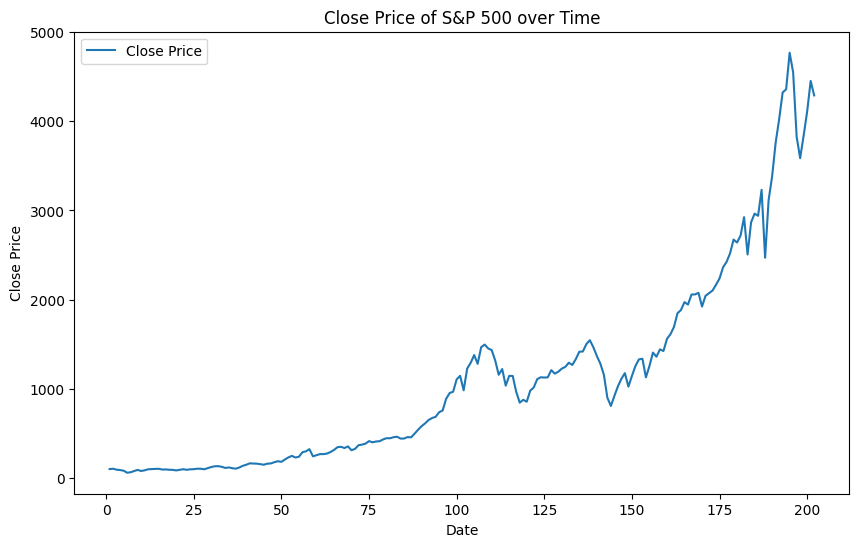

In [250]:
plt.figure(figsize=(10, 6))
plt.plot(merged_sp500.index, merged_sp500['Close'], label='Close Price')
plt.title('Close Price of S&P 500 over Time')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()

In [251]:
#Set the independent values as Previous
x = merged_sp500[['Previous']]
y = merged_sp500['Close']
x_train, x_test, y_train, y_test = train_test_split(x, y,random_state=0)

In [252]:
#Train the model
from sklearn.metrics import confusion_matrix, accuracy_score
regressor = LinearRegression()
regressor.fit(x_train,y_train)


LinearRegression()

In [253]:
x_train.shape
x_test.shape

(151, 1)

(51, 1)

In [254]:
predicted = regressor.predict(x_test)

In [255]:
sp500_regression = pd.DataFrame({'Actual':y_test,'Predicted':predicted})
print(sp500_regression)

         Actual   Predicted
19    95.099998  108.716580
172 2072.780029 2057.489801
108 1498.579956 1482.397550
99   970.429993  968.197811
179 2673.610107 2533.242784
184 2867.189941 2520.724018
6     63.389999   98.199220
147 1115.099976 1042.689925
13   103.589996  114.430576
153 1339.670044 1345.461790
62   271.910004  284.089263
126 1131.500000 1141.849258
182 2924.590088 2732.392111
155 1257.599976 1144.331097
81   449.019989  462.734225
8     82.639999   80.726998
34   117.080002  141.979854
131 1248.290039 1241.789290
38   121.970001  120.905106
75   417.089996  401.591476
176 2362.719971 2252.516371
146 1029.849976  936.095397
46   164.619995  165.406231
160 1562.170044 1439.307347
61   271.779999  271.190256
124 1132.170044 1124.817446
181 2718.370117 2654.837857
187 3230.780029 2954.427320
123 1111.920044 1031.051779
45   153.179993  171.410432
17   100.099998  111.398456
56   292.380005  254.458534
151 1257.640015 1159.161418
112 1160.329956 1333.323293
23    96.110001  114

In [256]:
len(predicted)


51

In [257]:
#Compute various statistics
print('Regressor Score:', regressor.score(x_test,y_test))
import math
from sklearn import metrics
from sklearn.metrics import confusion_matrix, accuracy_score
print("Mean Absolute Error:", metrics.mean_absolute_error(y_test,predicted))
print("Mean Squared Error:", metrics.mean_squared_error(y_test,predicted))
print("Root Mean Error:", math.sqrt(metrics.mean_squared_error(y_test,predicted)))

Regressor Score: 0.9865428817238657
Mean Absolute Error: 66.88026660900664
Mean Squared Error: 11972.752311177399
Root Mean Error: 109.42007270687311


In [258]:
predicted = regressor.predict(x)

Text(0.5, 0, 'Index')

Text(0, 0.5, 'Close Price')

Text(0.5, 1.0, 'Actual vs Predicted Close Price')

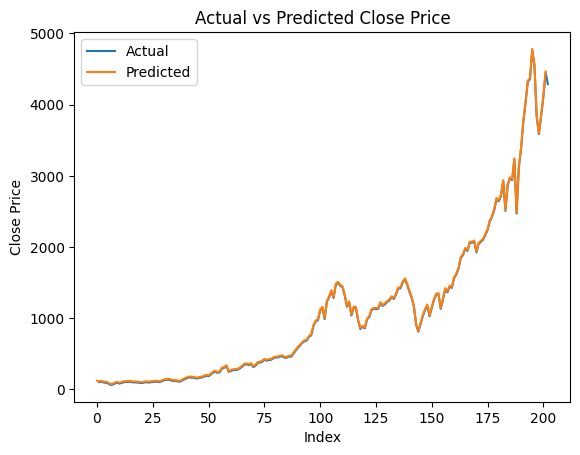

In [259]:
plt.plot(y, label="Actual")
plt.plot(predicted, label="Predicted")
plt.xlabel("Index")
plt.ylabel("Close Price")
plt.title("Actual vs Predicted Close Price")
plt.legend()


As we can see, a much better prediction has been made here. By using stock prices from the previous quarter, we can effectively predict the current Close stock price. Unfortunately, such a strong result could not have been achieved using the GDP.

Next, we will look at creating a decision tree, which will inform us about the conditions under which an investment could lead to positive ROI and the conditions under which an investment could lead to a negative ROI.

In [260]:
merged_sp500['Return'] = merged_sp500['Close'].pct_change(1).shift(-1) #Return column created, which looks at the percent change in the Close value per day.
pd.options.display.float_format = '{:.6f}'.format


In [261]:
merged_sp500.head()


,Date,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate,Forecast,Previous,Return
1,1973-07-01,1433.838000,0.000000,105.300003,103.680000,104.260002,104.260002,10770000,10.560000,44.200000,5.741627,106.907499,111.519997,0.037886
2,1973-10-01,1476.289000,0.000000,108.980003,107.080002,108.209999,108.209999,15830000,9.997000,45.600000,8.056872,107.467500,104.260002,-0.098512
3,1974-01-01,1491.209000,0.000000,98.300003,95.949997,97.550003,97.550003,23470000,9.323000,46.800000,9.601874,108.627499,108.209999,-0.044080
4,1974-04-01,1530.056000,0.000000,94.680000,92.820000,93.250000,93.250000,11470000,11.250000,48.100000,10.068650,108.060000,97.550003,-0.077534
5,1974-07-01,1560.026000,0.000000,86.889999,85.320000,86.019997,86.019997,10270000,12.090000,49.300000,11.538462,106.316251,93.250000,-0.263078


In [262]:
merged_sp500.isnull().sum()
merged_sp500.dropna(inplace=True) #Remove null values in newly created Return column
merged_sp500.isnull().sum()

Date              0
GDP               0
Open              0
High              0
Low               0
Close             0
Adj Close         0
Volume            0
Interest_Rate     0
CPI               0
Inflation_Rate    0
Forecast          0
Previous          0
Return            1
dtype: int64

Date              0
GDP               0
Open              0
High              0
Low               0
Close             0
Adj Close         0
Volume            0
Interest_Rate     0
CPI               0
Inflation_Rate    0
Forecast          0
Previous          0
Return            0
dtype: int64

In [263]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import graphviz

x = merged_sp500.drop(columns=['Close','Date','Adj Close', 'Return','Forecast']) #Independent variables
y = np.where(merged_sp500.Return > 0,1,0) #Return is the dependent binary variable, returning either 0 or 1
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [264]:
#Train the model
treeClassifier = DecisionTreeClassifier(max_depth = 3, min_samples_leaf= 4)
treeClassifier.fit(X_train,y_train)
y_pred = treeClassifier.predict(X_test)

DecisionTreeClassifier(max_depth=3, min_samples_leaf=4)

In [265]:
#Classification Report
from sklearn.metrics import classification_report
report = classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        16
           1       0.73      0.96      0.83        45

    accuracy                           0.70        61
   macro avg       0.36      0.48      0.41        61
weighted avg       0.54      0.70      0.61        61



From this Classification Report, we gather that overall the model is only 63% accurate. Using the f1-score as our key metric, which resembles the mean of precision and recall, we see that 31% of unsuccessful investments were correctly identified and 74% of successful investments were identified. These numbers can definitely increase if more data is provided.

In [266]:
merged_sp500.head()

,Date,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate,Forecast,Previous,Return
1,1973-07-01,1433.838000,0.000000,105.300003,103.680000,104.260002,104.260002,10770000,10.560000,44.200000,5.741627,106.907499,111.519997,0.037886
2,1973-10-01,1476.289000,0.000000,108.980003,107.080002,108.209999,108.209999,15830000,9.997000,45.600000,8.056872,107.467500,104.260002,-0.098512
3,1974-01-01,1491.209000,0.000000,98.300003,95.949997,97.550003,97.550003,23470000,9.323000,46.800000,9.601874,108.627499,108.209999,-0.044080
4,1974-04-01,1530.056000,0.000000,94.680000,92.820000,93.250000,93.250000,11470000,11.250000,48.100000,10.068650,108.060000,97.550003,-0.077534
5,1974-07-01,1560.026000,0.000000,86.889999,85.320000,86.019997,86.019997,10270000,12.090000,49.300000,11.538462,106.316251,93.250000,-0.263078


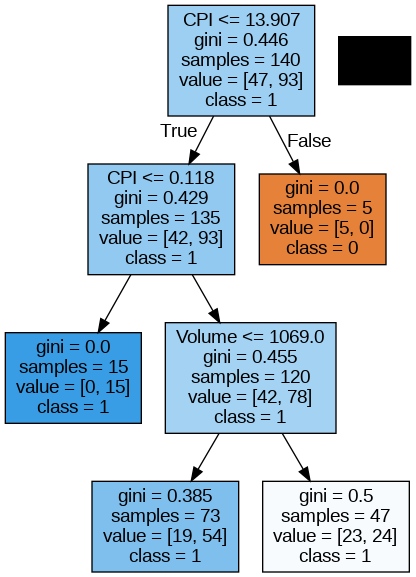

In [267]:
from IPython.display import Image
import pydotplus

tree.export_graphviz(treeClassifier, out_file='tree.dot',
    feature_names=['Open', 'Previous', 'GDP', 'Interest_Rate', 'Inflation_Rate', 'CPI', 'High', 'Low','Volume'], class_names=np.array(['0','1']),
    filled=True)
graph = pydotplus.graph_from_dot_file('tree.dot')
Image(graph.create_png(), width=900)

A decision tree with a depth of 3 and 8 leaves was created. It appears that Low was the primary attribute to split the data. High, Open, and Volume were also used. Among the macroeconomic factors, GDP and CPI were used to further split the data. the gini values for most of the leaves were quite low, which is good to see.

In [268]:
#Create a table to compare the Return column to our Decision Tree Predictions
merged_sp500['Predicted_Return'] = treeClassifier.predict(x)
predicted_df = merged_sp500[['Date', 'Predicted_Return', 'Return']]
predicted_df


,Date,Predicted_Return,Return
1,1973-07-01,1,0.037886
2,1973-10-01,1,-0.098512
3,1974-01-01,1,-0.044080
4,1974-04-01,1,-0.077534
5,1974-07-01,1,-0.263078
6,1974-10-01,1,0.081559
7,1975-01-01,1,0.205368
8,1975-04-01,1,0.147749
9,1975-07-01,1,-0.125672
10,1975-10-01,1,0.087544


We thought of training another classification model, but omitting the 'Open', 'High', 'Low' columns, as they are very strongly correlated to the Close Price and Return. After all, we are investigating macroeconomics and stock price. We decided to leave Previous and Volume. Previous is an interesting feature created, resembling the Close prices of last quarter. It could be worth keeping it in.

In [269]:
x = merged_sp500.drop(columns=['Close','Date','Adj Close', 'Return','Forecast','High','Low','Open']) #Independent variables
y = np.where(merged_sp500.Return > 0,1,0) #Return is the dependent binary variable, returning either 0 or 1
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [270]:
#Train the model
treeClassifier = DecisionTreeClassifier(max_depth = 3)
treeClassifier.fit(X_train,y_train)
y_pred = treeClassifier.predict(X_test)

DecisionTreeClassifier(max_depth=3)

In [271]:
#Classification Report
from sklearn.metrics import classification_report
report = classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        16
           1       0.73      0.96      0.83        45

    accuracy                           0.70        61
   macro avg       0.36      0.48      0.41        61
weighted avg       0.54      0.70      0.61        61



Classification Report is looking similar to the previous one, even with changed X values.

In [273]:
merged_sp500

,Date,GDP,Open,High,Low,Close,Adj Close,Volume,Interest_Rate,CPI,Inflation_Rate,Forecast,Previous,Return,Predicted_Return
1,1973-07-01,1433.838000,0.000000,105.300003,103.680000,104.260002,104.260002,10770000,10.560000,44.200000,5.741627,106.907499,111.519997,0.037886,1
2,1973-10-01,1476.289000,0.000000,108.980003,107.080002,108.209999,108.209999,15830000,9.997000,45.600000,8.056872,107.467500,104.260002,-0.098512,1
3,1974-01-01,1491.209000,0.000000,98.300003,95.949997,97.550003,97.550003,23470000,9.323000,46.800000,9.601874,108.627499,108.209999,-0.044080,1
4,1974-04-01,1530.056000,0.000000,94.680000,92.820000,93.250000,93.250000,11470000,11.250000,48.100000,10.068650,108.060000,97.550003,-0.077534,1
5,1974-07-01,1560.026000,0.000000,86.889999,85.320000,86.019997,86.019997,10270000,12.090000,49.300000,11.538462,106.316251,93.250000,-0.263078,1
6,1974-10-01,1599.679000,0.000000,64.370003,61.750000,63.389999,63.389999,16890000,9.347000,51.000000,11.842105,103.676250,86.019997,0.081559,1
7,1975-01-01,1616.116000,0.000000,69.040001,67.150002,68.559998,68.559998,20970000,6.303000,52.300000,11.752137,97.781250,63.389999,0.205368,1
8,1975-04-01,1651.853000,0.000000,83.589996,81.980003,82.639999,82.639999,14480000,5.420000,53.000000,10.187110,91.594999,68.559998,0.147749,1
9,1975-07-01,1709.820000,0.000000,95.730003,94.129997,94.849998,94.849998,20390000,6.160000,54.000000,9.533469,87.985000,82.639999,-0.125672,1
10,1975-10-01,1761.831000,0.000000,85.449997,82.570000,82.930000,82.930000,14070000,5.413000,54.900000,7.647059,86.808749,94.849998,0.087544,1


In [272]:
from IPython.display import Image
import pydotplus

tree.export_graphviz(treeClassifier, out_file='tree.dot',
    feature_names=['Previous', 'GDP', 'Interest_Rate', 'Inflation_Rate', 'CPI','Volume'], class_names=np.array(['0','1']),
    filled=True)
graph = pydotplus.graph_from_dot_file('tree.dot')
Image(graph.create_png(), width=900)

ValueError: Length of feature_names, 6 does not match number of features, 7

A decision tree with a depth of 3 and 8 leaves was created again. The gini values are fairly low here as well. Here, we see that CPI suprisingly was the main attribute used to split the data, and GDP is nowhere to be seen. Interest and Inflation rates have also been used.

In [ ]:
#Create a table to compare the Return column to our Decision Tree Predictions
merged_sp500['Predicted_Return2'] = treeClassifier.predict(x)
predicted_df2 = merged_sp500[['Date', 'Predicted_Return2', 'Return']]
predicted_df2